In [1]:
# Učitaj osnovne biblioteke...
import scipy as sp
import sklearn
import itertools
import cv2
import numpy as np

%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
# bgr_image = cv2.imread('notredame16/02.jpg')
# gray_image = cv2.cvtColor(bgr_image,cv2.COLOR_BGR2GRAY)

In [3]:
#cv2.imshow('image',image)

In [4]:
#scan_line = gray_image[len(gray_image)*2/3,:]


In [20]:
from scipy import ndimage

def symmetry_factor(scan_line, index, width, kernel):
    left = scan_line[index-width:index].astype(float)
    right = np.flipud(scan_line[index:index+width]).astype(float)
    diff = np.abs(left - right)
    return diff.dot(kernel) #+255- np.std(left)+255 - np.std(right)#np.average(diff) 

def scan_whole_line(whole_image, height_index=400, width = 100):
    scan_line = whole_image[height_index,:]
    X = range(width,len(scan_line)-width)
    kernel = cv2.getGaussianKernel(width*2,0)[width:]*2
    return np.squeeze(np.array([symmetry_factor(scan_line,index,width,kernel) for index in X]))


In [21]:
def unique_rows(a,orderBy):
    order = np.lexsort(orderBy.T)
    a = a[order]
    orderBy = orderBy[order]
    diff = np.diff(orderBy, axis=0)
    ui = np.ones(len(orderBy), 'bool')
    ui[1:] = (diff != 0).any(axis=1) 
    return a[ui]

def process_features(gray_image,width,features,bgr_image):
    assert width in [np.power(2,i) for i in xrange(0,10)]
    feature_vectors = []
    for feature_y, feature_x in features:
        scan_line = gray_image[feature_y,:]
        index = feature_x
        
        left = scan_line[index-width:index].astype(float)
        right = np.flipud(scan_line[index:index+width]).astype(float)
        
        avg_line = (left + right)/2
        avg_value = np.average(avg_line)
        
        feature_vector = avg_line<avg_value
        
        feature_vector = sp.ndimage.zoom(feature_vector, 128/float(width), order=0).astype(int)
        
        xy = np.array([feature_x,feature_y])
        feature_vector = np.hstack((feature_vector,xy))
        
        feature_vectors.append(feature_vector)
    return np.array(feature_vectors).astype(int)#, feature_map
#print process_features(gray_image,16,[[50,100],[60,20]],gray_image)


In [162]:

import scipy.ndimage as ndimage
import scipy.ndimage.filters as filters

def create_symmetry_map(image,width,verbose=False):
    img = np.zeros(image.shape[1] - width*2)
    for num in xrange(1,image.shape[0]):
        results = scan_whole_line(image,num,width)
        img = np.vstack((img,results))
    img = img.astype(np.float32)
    kernel_size= 11
    if verbose:
        plt.figure(figsize=(10,10))
        plt.imshow(img,cmap='gray')
        plt.show()
    img = cv2.GaussianBlur(img,sigmaX=0,ksize=(kernel_size,1)) 
    img = cv2.Sobel(img,cv2.CV_32F,2,0,ksize=kernel_size)
    padding = np.zeros((img.shape[0],width))
    
    if verbose:
        plt.figure(figsize=(10,10))
        plt.imshow(img,cmap='gray')

        plt.show()
    return np.hstack((padding,img,padding))#[:,w:img.shape[1]-w]


def proceess_image(bgr_image,w,verbose = True):
   
    gray_image = cv2.cvtColor(bgr_image,cv2.COLOR_BGR2GRAY)
    gray_image = cv2.GaussianBlur(gray_image,sigmaX=0,ksize=(3,3)) 
    
    if bgr_image.shape[1] -2*w<= 0 or bgr_image.shape[0]-2*w<=0:
        return
    
    processed_map_horizontal = create_symmetry_map(gray_image,w,verbose)
    
    processed_map_vertical = create_symmetry_map(gray_image.T,w,verbose)
    
    
    processed_map_horizontal[processed_map_horizontal<0]=0
    processed_map_vertical[processed_map_vertical<0]=0
    processed_map = processed_map_horizontal*processed_map_vertical.T
    processed_map = processed_map.astype(np.float32)
    processed_map[processed_map<np.max(processed_map)*0.0] = 0
    
    neighborhood_size = 5
    threshold = 0

    data = processed_map

    data_max = filters.maximum_filter(data, neighborhood_size)
    maxima = (data == data_max)
    data_min = filters.minimum_filter(data, neighborhood_size)
    diff = ((data_max - data_min) > threshold)
    maxima[diff == 0] = 0

    labeled, num_objects = ndimage.label(maxima)
    xy = np.array(ndimage.center_of_mass(data, labeled, range(1, num_objects+1)))
    if verbose:
        cv2.imshow("s",processed_map)
        plt.imshow(processed_map_horizontal,cmap='gray')
        plt.show()
        plt.imshow(processed_map_vertical,cmap='gray')
        plt.show()
        
        
        print "Feature count: "+str(len(xy))

        plt.imshow(processed_map,cmap='gray')    
        
        plt.scatter(xy[:, 1], xy[:, 0],marker='+',c='r')
        plt.show()
        
        plt.figure(figsize=(15,15.0/(640.0/480.0)))
        imgg = bgr_image.copy()
        imgg = cv2.resize(imgg,(0,0),fx=2,fy=2)
        for l in xy:
            cv2.circle(imgg,(int(l[1]*2),int(l[0]*2)),w*2,(255,0,0))


        plt.imshow(imgg)

        plt.axis([0,imgg.shape[1],imgg.shape[0],0])
        plt.scatter(xy[:, 1]*2, xy[:, 0]*2,marker='+',c='r')
        plt.show()
    
    return process_features(gray_image,w,xy,bgr_image)


In [163]:
def preprocess_image(image, max_width=640/2, max_height = 480/2):
    factor = 1
    if image.shape[0]>max_height:
        factor = max_height/float(image.shape[0])
    if image.shape[1]>max_width:
        f2 = max_width/float(image.shape[1])
        factor = f2 if f2 <factor else factor
    return cv2.resize(image,(0,0),fx=factor,fy=factor,interpolation=cv2.INTER_CUBIC) if factor <1 else image

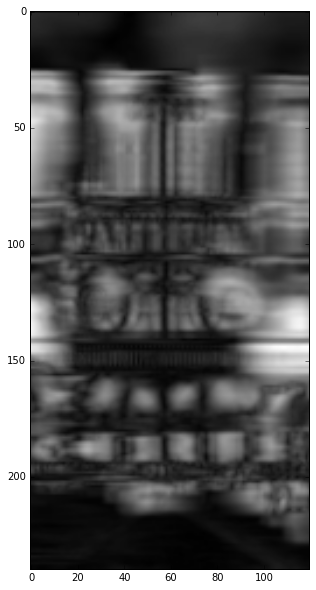

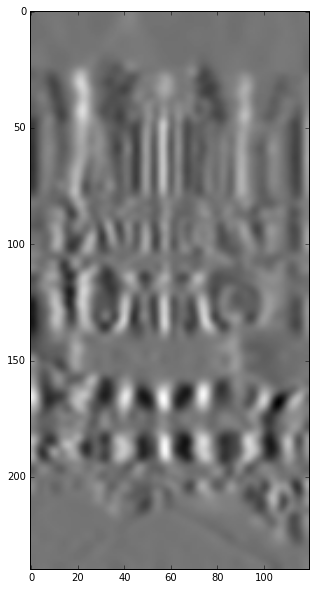

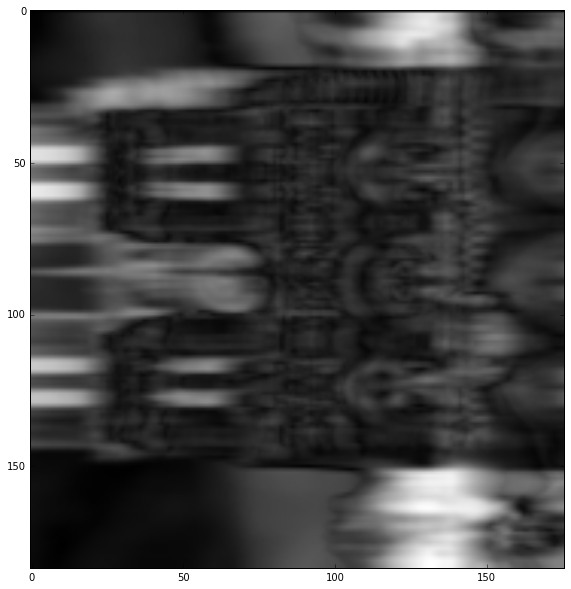

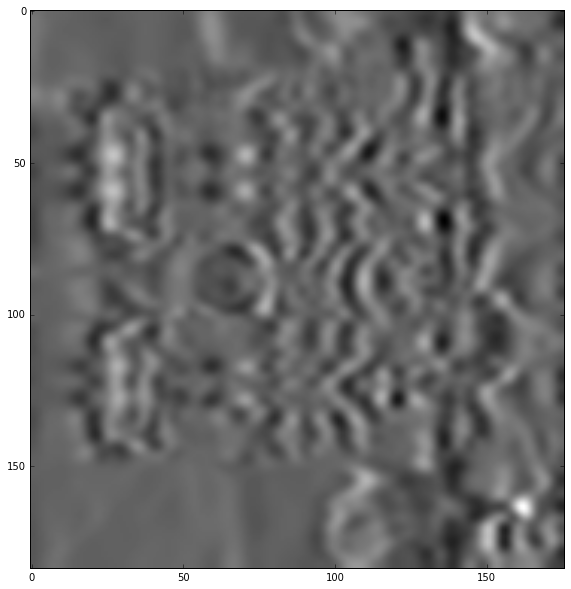

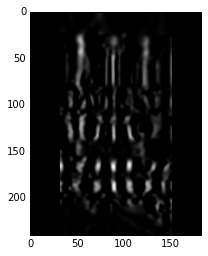

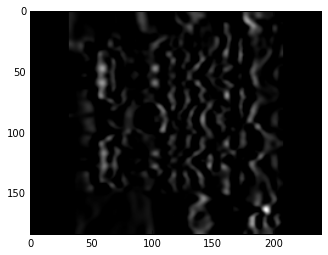

Feature count: 165


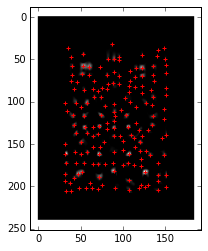

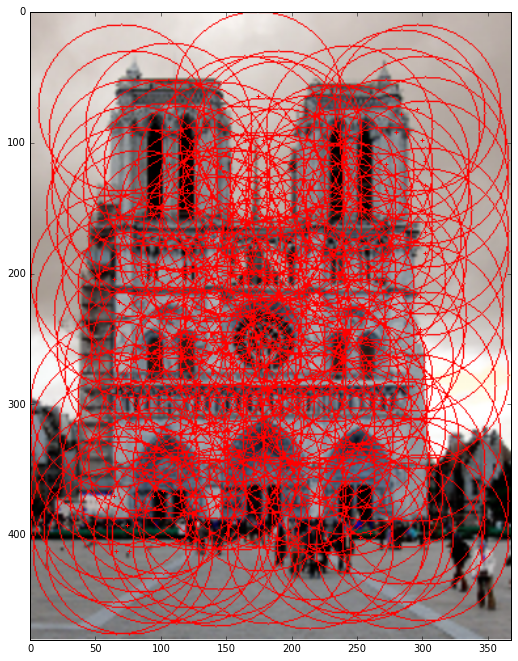

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [164]:
#bgr_image = cv2.imread('notredame16/01.jpg')
#proceess_image(bgr_image,100)
bgr_image = cv2.imread('notredame16/02.jpg')
#proceess_image(bgr_image,100)
#bgr_image = cv2.imread('notredame16/ne_notredame.jpg')
bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,32);

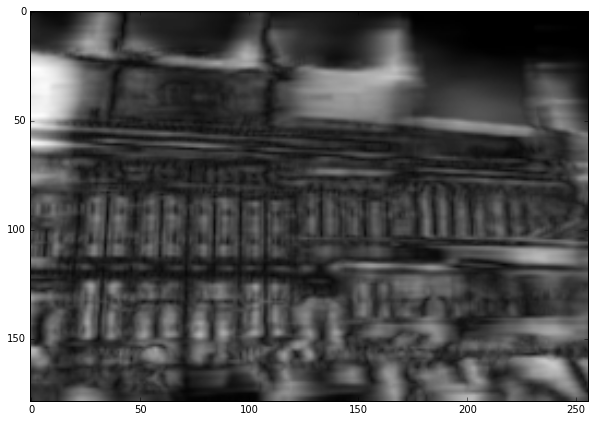

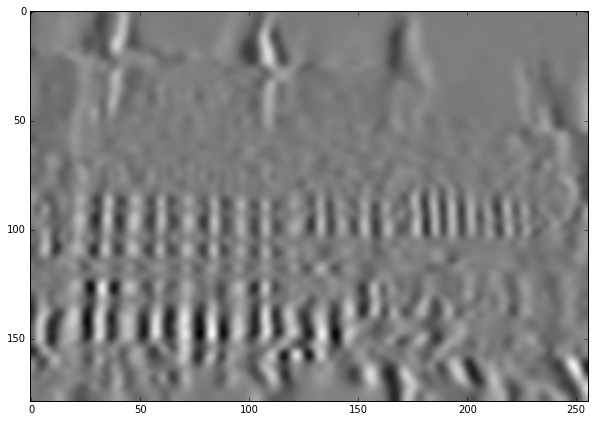

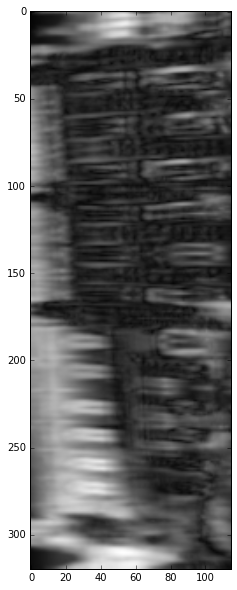

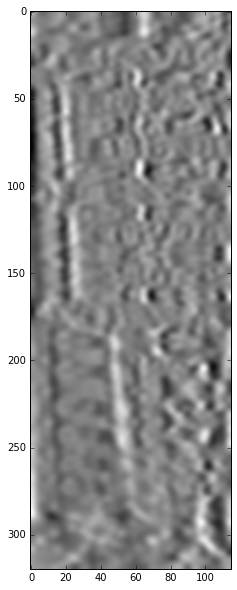

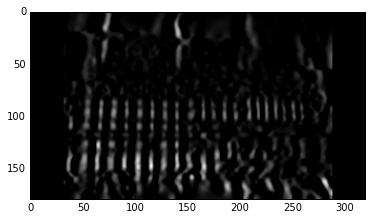

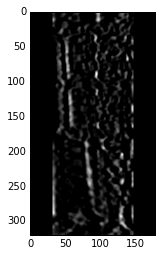

Feature count: 277


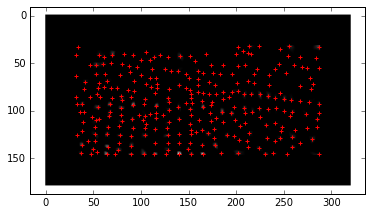

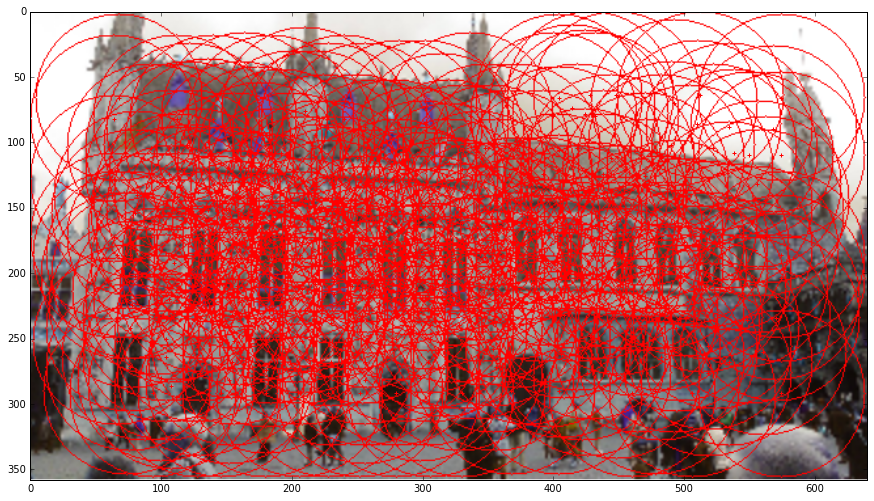

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  0,   0,   0, ...,   0, 214,  32],
       [  1,   1,   1, ...,   0, 224,  32],
       [  1,   1,   1, ...,   0, 256,  32],
       ..., 
       [  1,   1,   1, ...,   0, 230, 146],
       [  1,   1,   1, ...,   1, 253, 146],
       [  0,   0,   0, ...,   1, 287, 146]])

In [165]:
#bgr_image = cv2.imread('notredame16/01.jpg')
bgr_image = cv2.imread('angle4.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,32)

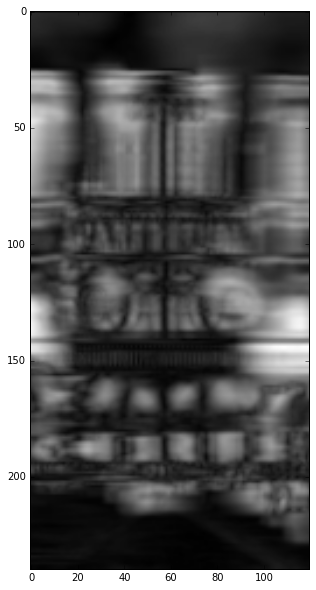

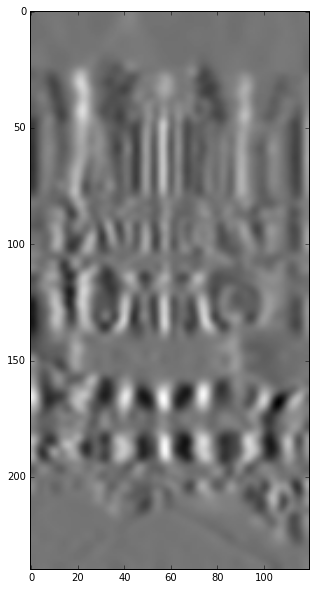

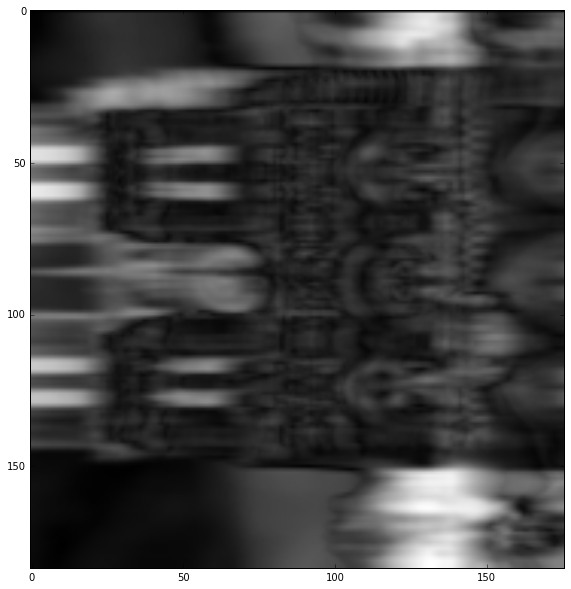

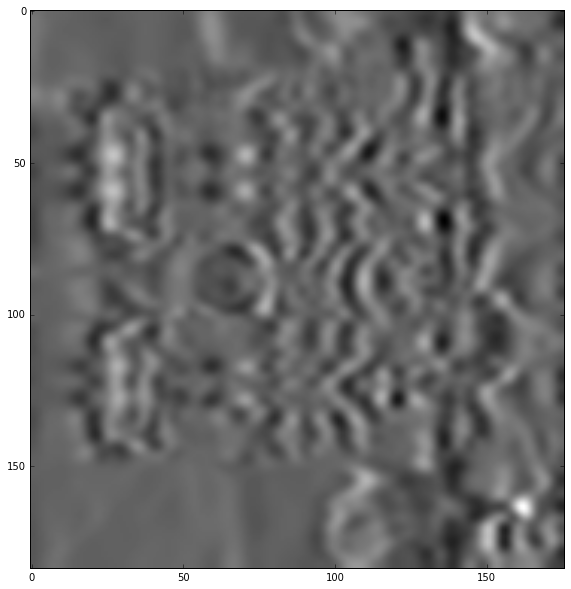

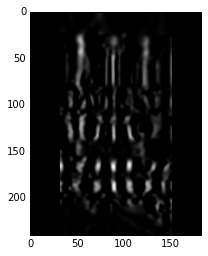

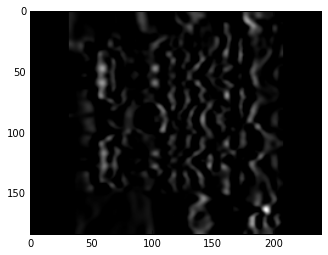

Feature count: 165


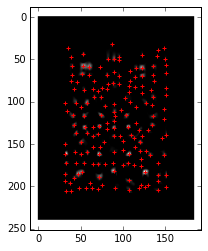

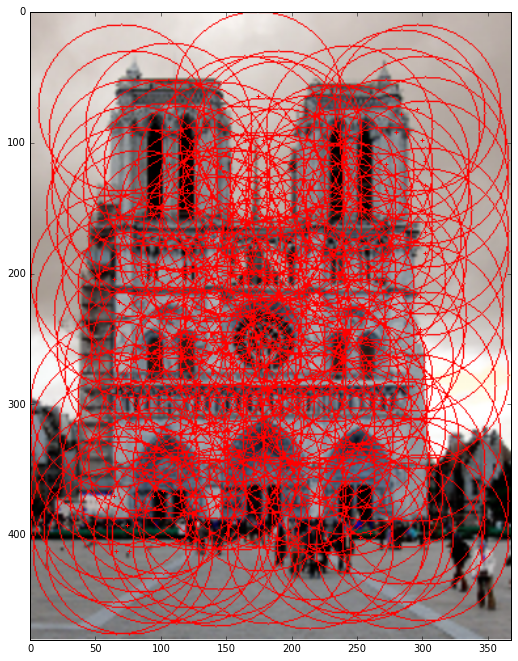

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  1,   1,   1, ...,   0,  87,  32],
       [  0,   0,   0, ...,   1,  35,  37],
       [  1,   1,   1, ...,   0, 148,  37],
       ..., 
       [  1,   1,   1, ...,   1, 141, 204],
       [  1,   1,   1, ...,   1,  33, 206],
       [  1,   1,   1, ...,   1,  38, 206]])

In [166]:
bgr_image = cv2.imread('notredame16/02.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,32)

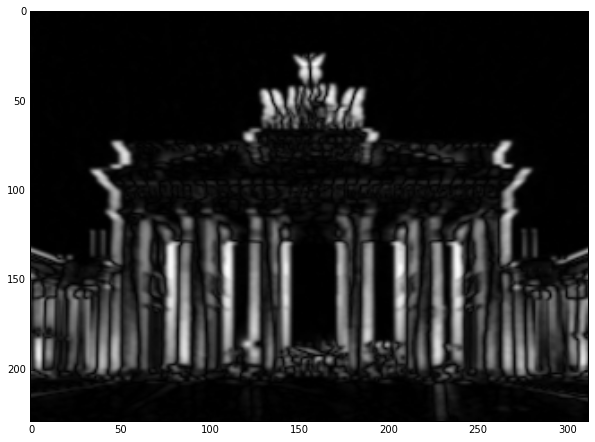

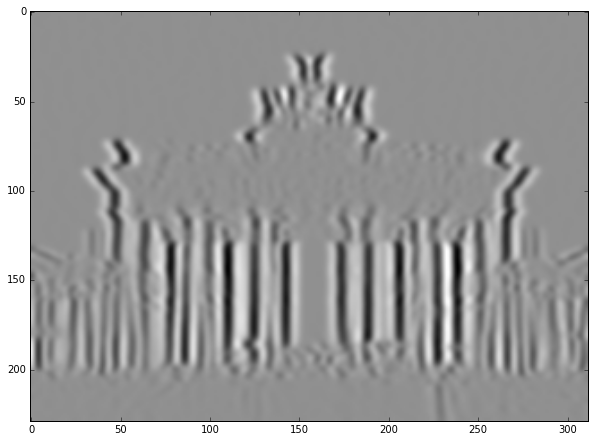

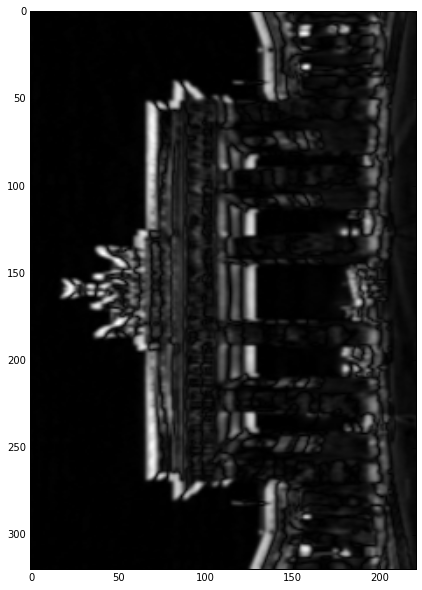

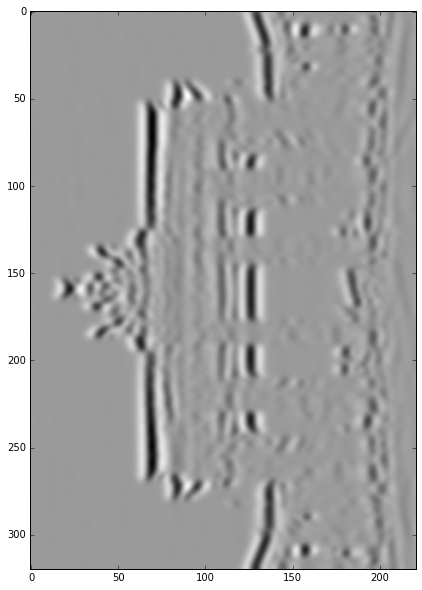

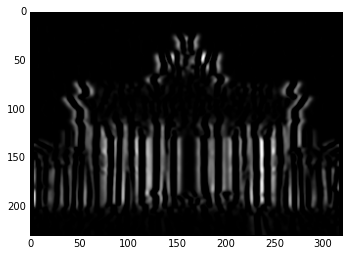

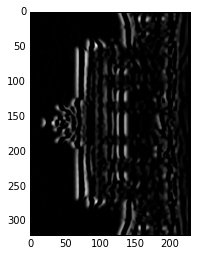

Feature count: 776


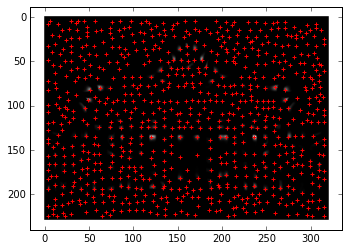

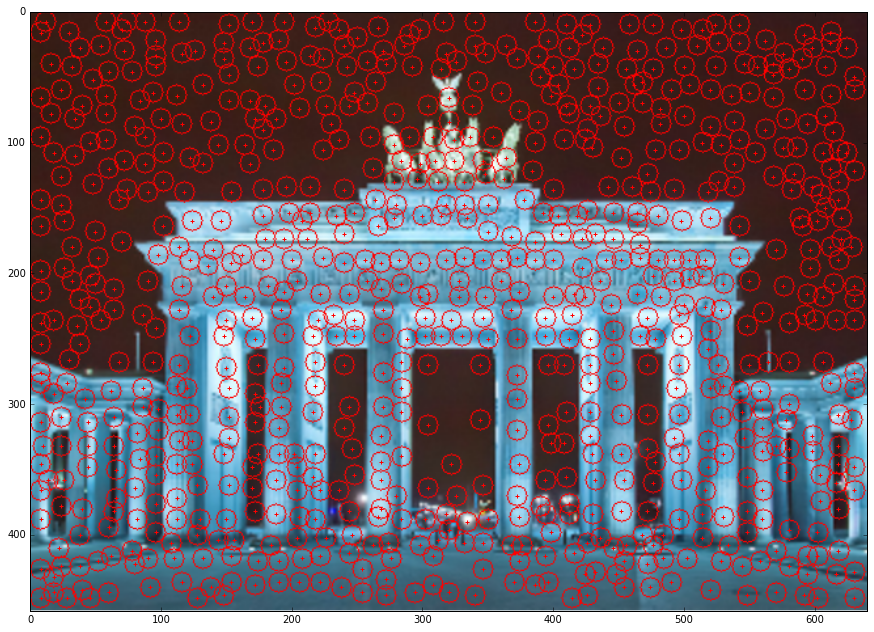

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  0,   0,   0, ...,   1,   6,   4],
       [  0,   0,   0, ...,   1,  29,   4],
       [  1,   1,   1, ...,   0,  37,   4],
       ..., 
       [  1,   1,   1, ...,   0, 207, 224],
       [  0,   0,   0, ...,   0, 301, 224],
       [  1,   1,   1, ...,   0, 315, 224]])

In [167]:
bgr_image = cv2.imread('tor_700p.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,4)

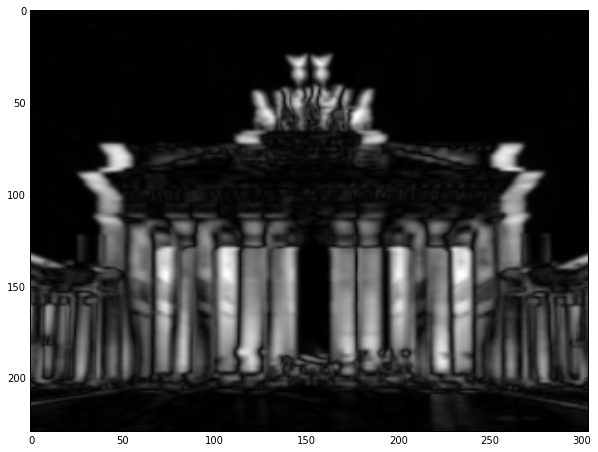

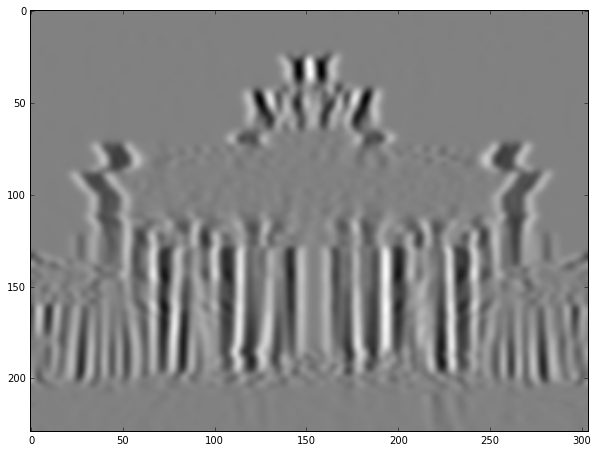

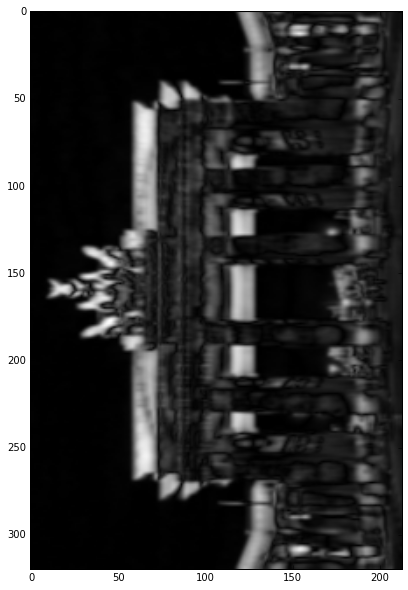

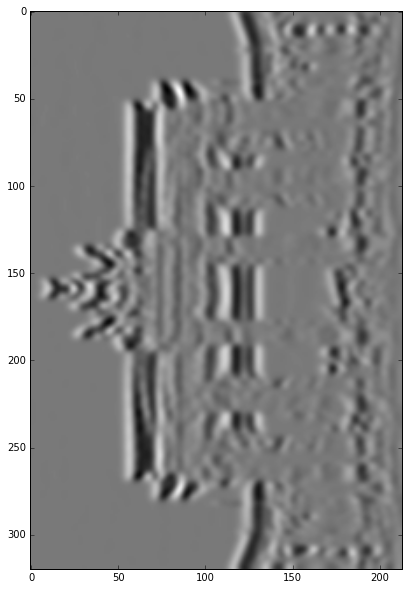

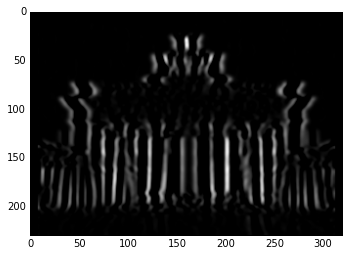

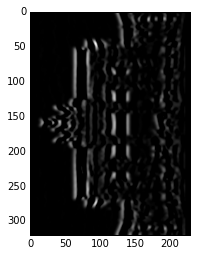

Feature count: 585


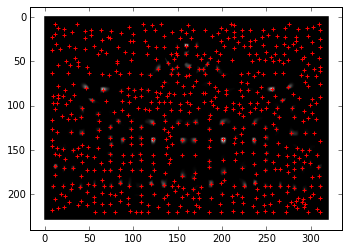

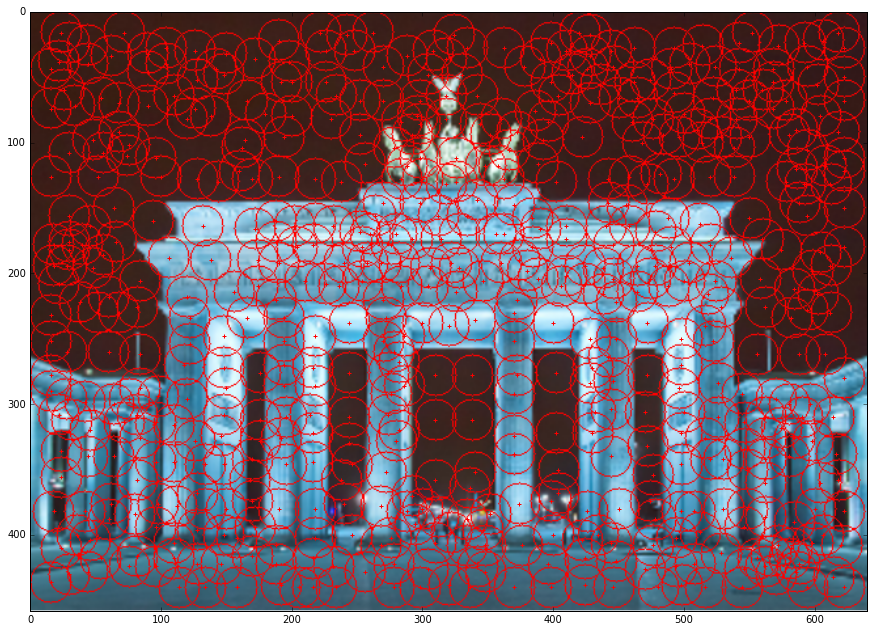

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  1,   1,   1, ...,   0,  12,   8],
       [  0,   0,   0, ...,   1,  36,   8],
       [  1,   1,   1, ...,   1, 111,   8],
       ..., 
       [  0,   0,   0, ...,   1, 272, 220],
       [  0,   0,   0, ...,   1, 297, 220],
       [  1,   1,   1, ...,   0, 311, 220]])

In [168]:
bgr_image = cv2.imread('tor_700p.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,8)

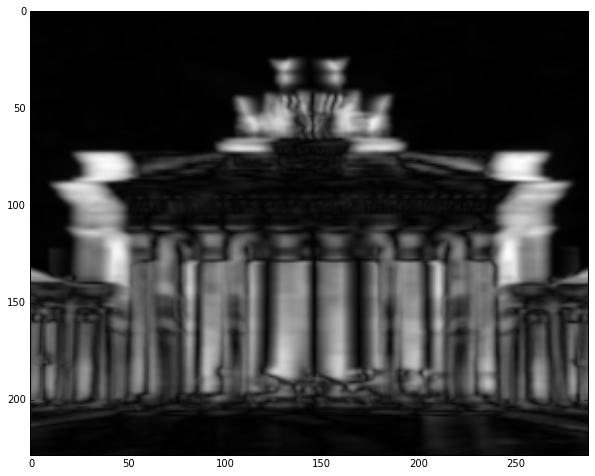

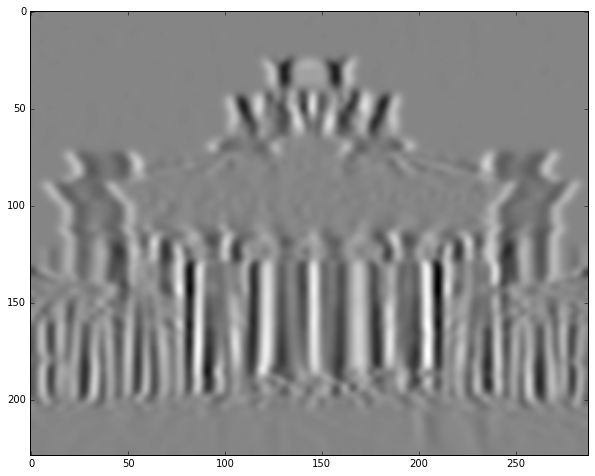

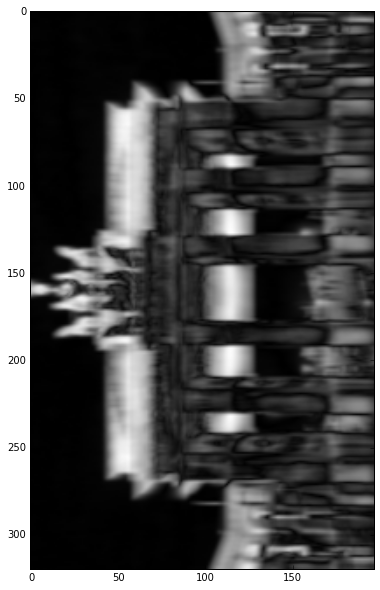

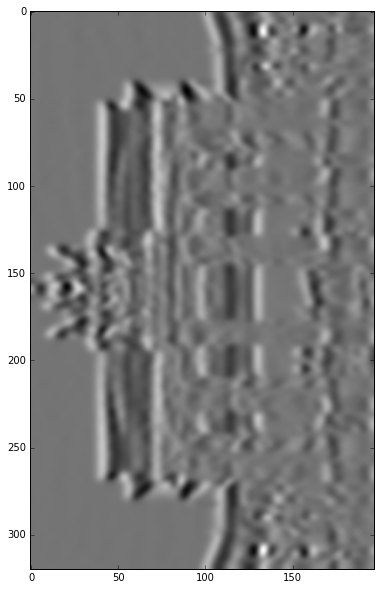

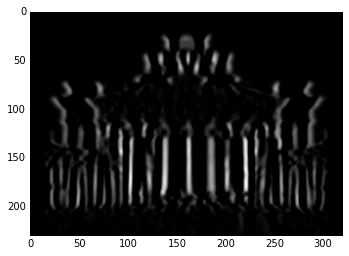

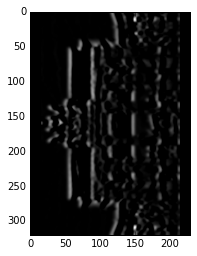

Feature count: 427


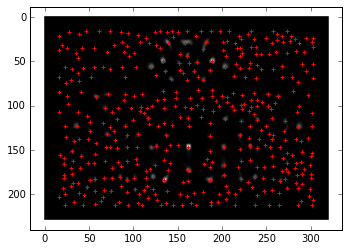

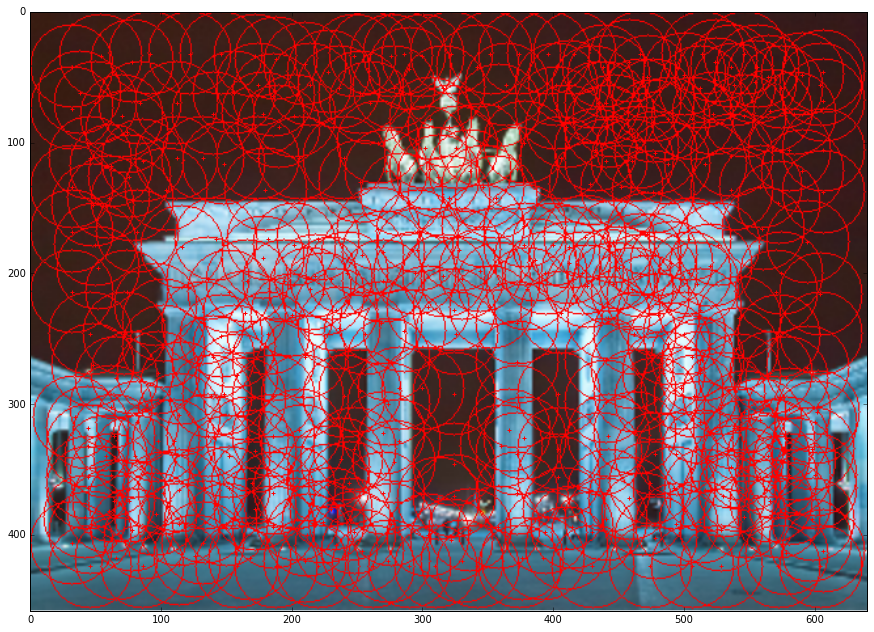

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  0,   0,   0, ...,   1,  46,  16],
       [  1,   1,   1, ...,   0,  61,  16],
       [  0,   0,   0, ...,   1,  73,  16],
       ..., 
       [  0,   0,   0, ...,   0, 264, 212],
       [  0,   0,   0, ...,   0, 286, 212],
       [  0,   0,   0, ...,   0, 302, 212]])

In [169]:
bgr_image = cv2.imread('tor_700p.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,16)

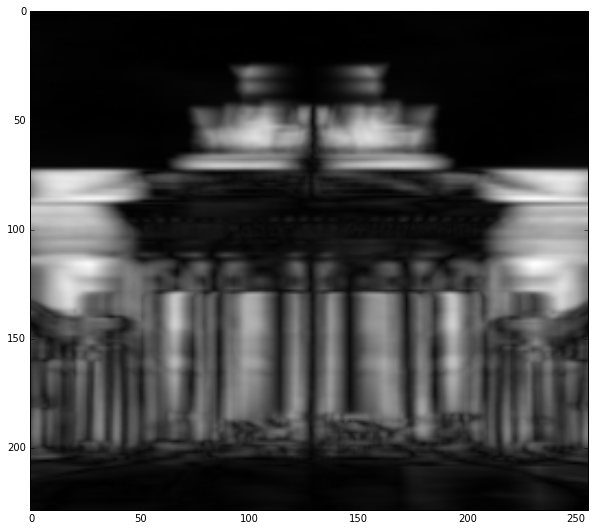

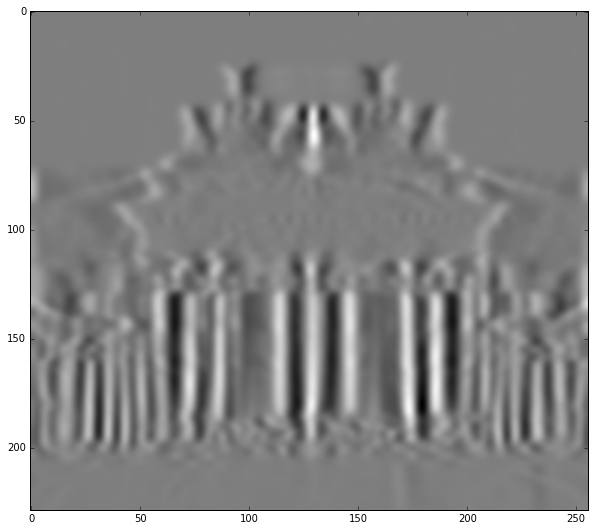

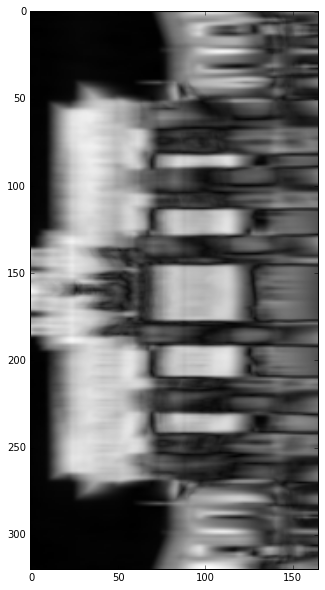

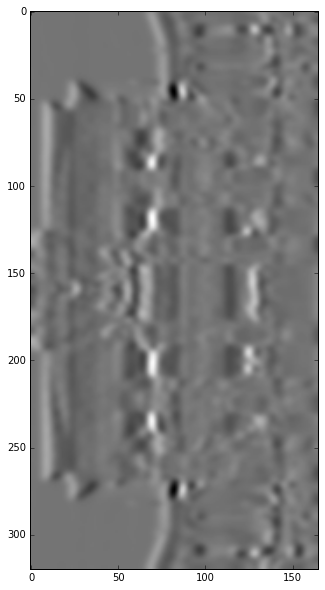

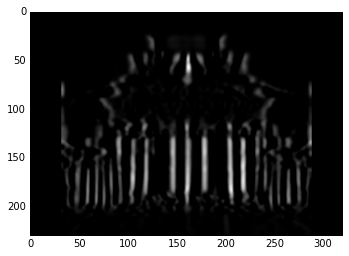

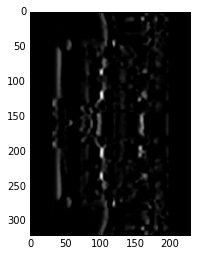

Feature count: 268


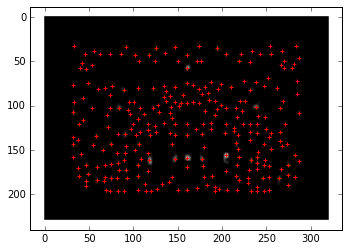

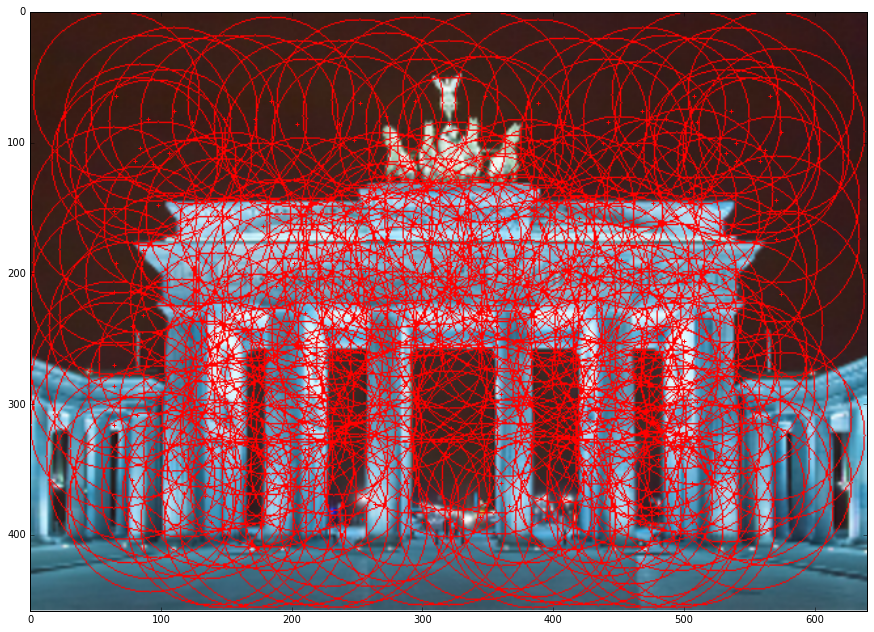

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  0,   0,   0, ...,   1,  33,  32],
       [  1,   1,   1, ...,   1, 174,  32],
       [  1,   1,   1, ...,   1, 254,  32],
       ..., 
       [  0,   0,   0, ...,   1, 233, 196],
       [  1,   1,   1, ...,   1, 239, 196],
       [  0,   0,   0, ...,   0, 247, 196]])

In [170]:
bgr_image = cv2.imread('tor_700p.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,32)

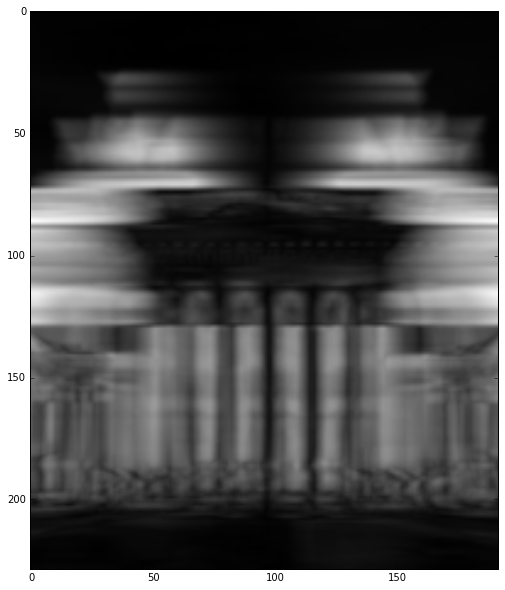

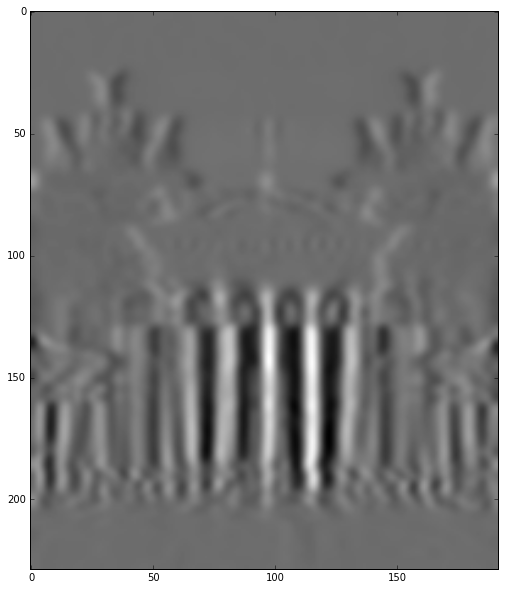

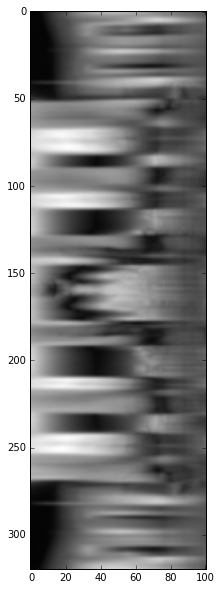

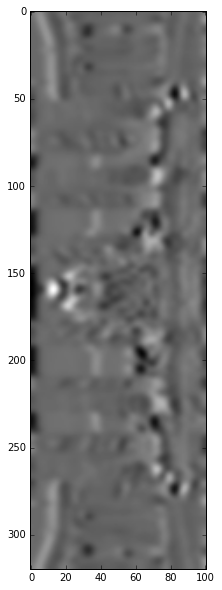

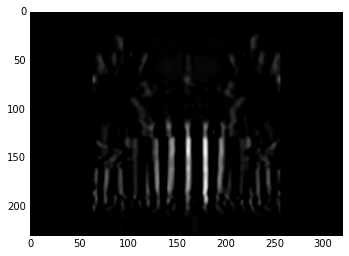

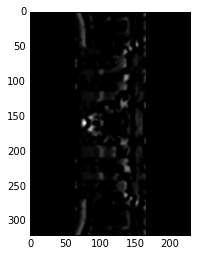

Feature count: 128


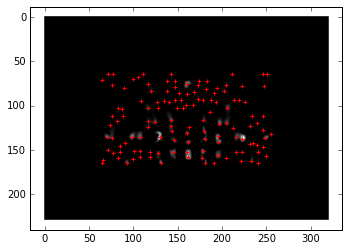

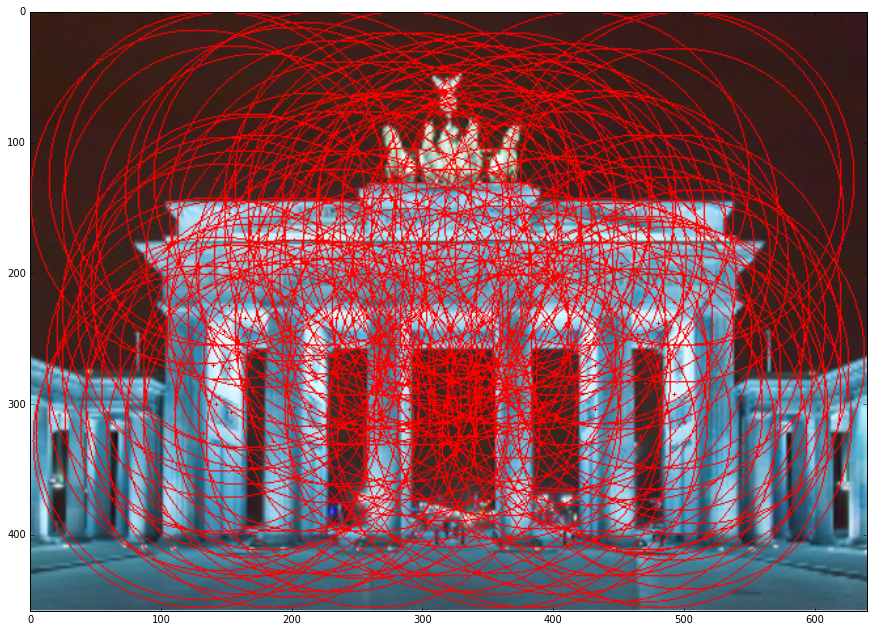

-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  1,   1,   1, ...,   0,  71,  64],
       [  1,   1,   0, ...,   1,  77,  64],
       [  1,   1,   1, ...,   1, 111,  64],
       ..., 
       [  0,   0,   0, ...,   0, 181, 164],
       [  0,   0,   0, ...,   0, 191, 164],
       [  1,   1,   0, ...,   1, 241, 164]])

In [171]:
bgr_image = cv2.imread('tor_700p.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,64)

In [172]:
bgr_image = cv2.imread('tor_700p.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,128)

In [173]:
bgr_image = cv2.imread('tor_700p.jpg')

bgr_image = preprocess_image(bgr_image)
proceess_image(bgr_image,256)

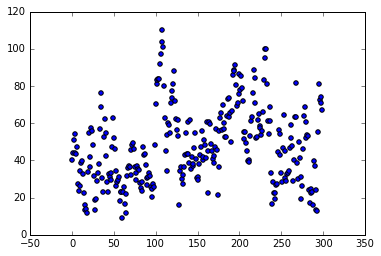

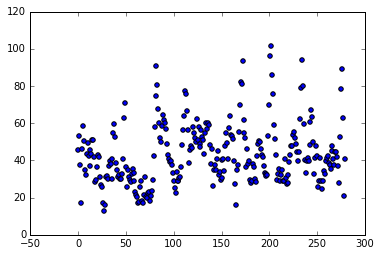

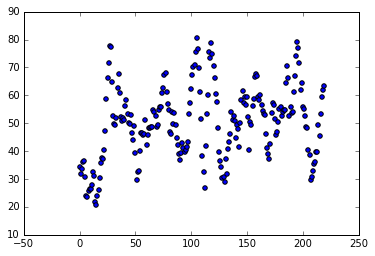

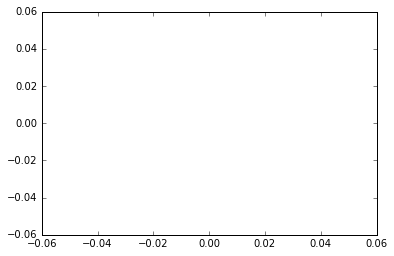

In [174]:

gray_image = cv2.cvtColor(bgr_image,cv2.COLOR_BGR2GRAY)
processed_image = gray_image.copy()
for x in [10,20,50,300]:
    results = scan_whole_line(processed_image,200,x)
    #plt.axis([0,len(results),0,np.max(results)*1.1])
    plt.scatter(range(len(results)),results)
    plt.show()

In [175]:
diff = np.ones((2,1))
diff *=diff
kernel = cv2.getGaussianKernel(len(diff),0)
print kernel
print np.sum(kernel * diff)#np.average(diff) 

[[ 0.5]
 [ 0.5]]
1.0


In [176]:
N=20
D=3000

sampleInput = cv2.getGaussianKernel(N*2,0)[:N].T*2*D
print sampleInput

left = list(sampleInput[0])#np.ones(N)*D
right = np.zeros(N)
diff = np.abs(left - right)
kernel = cv2.getGaussianKernel(len(diff)*2,0)[len(diff):]*2
print diff.shape
print kernel.shape
diff = diff.dot(kernel)
print diff

[[   3.38255069    5.41856494    8.46747118   12.90781246   19.19468732
    27.84446721   39.40272502   54.3930083    73.2469213    96.21995442
   123.30207743  154.13636614  187.96167803  223.59546269  259.46939222
   293.72354287  324.35519396  349.40766735  367.17531847  376.39513802]]
(20,)
(20, 1)
[ 43.63931937]


In [177]:
r = np.zeros(5)
r[1:4] = cv2.getGaussianKernel(3,0)[0]
print r
cv2.getGaussianKernel(5,0)[0] - r

[ 0.    0.25  0.25  0.25  0.  ]


array([ 0.0625, -0.1875, -0.1875, -0.1875,  0.0625])

In [178]:
#print cv2.Sobel(1,1,3)

In [179]:
np.array([1,2,3]) * np.array([2,3,4])

array([ 2,  6, 12])

IndexError: too many indices for array

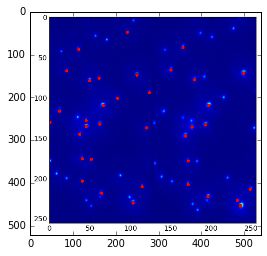

In [180]:
import numpy as np
import scipy
import scipy.ndimage as ndimage
import scipy.ndimage.filters as filters
import matplotlib.pyplot as plt

fname = '86XgT.png'
neighborhood_size = 5
threshold = 1500

data = scipy.misc.imread(fname)

data_max = filters.maximum_filter(data, neighborhood_size)
maxima = (data == data_max)
data_min = filters.minimum_filter(data, neighborhood_size)
diff = ((data_max - data_min) > threshold)
maxima[diff == 0] = 0

labeled, num_objects = ndimage.label(maxima)
xy = np.array(ndimage.center_of_mass(data, labeled, range(1, num_objects+1)))

plt.imshow(data)
plt.savefig('data.png', bbox_inches = 'tight')

plt.autoscale(False)
plt.plot(xy[:, 1], xy[:, 0], 'ro')
plt.savefig('result.png', bbox_inches = 'tight')

In [181]:
def get_features(path_to_image):
    print "Calculating for: "+path_to_image
    bgr_image = cv2.imread(path_to_image)

    bgr_image = preprocess_image(bgr_image)
    
    features_all = []
    #feature_map = {}
    i=3
    while True:
        features = proceess_image(bgr_image,np.power(2,i),verbose=False)
        #print features
        if features is None:
            break
        features_all +=list(features)
        
        #for key,value in feature_map_new.iteritems():
        #    if key in feature_map:
        #        feature_map[key] +=value
        #    else:
        #        feature_map[key] = value
        print "+"+str(features.shape[0])
        i+=1

    print "Feature count: "+str(len(features_all))
    return np.array(features_all)#, feature_map
get_features("tor_700p.jpg")

Calculating for: tor_700p.jpg
+585
+427
+268
+128
Feature count: 1408


-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


array([[  1,   1,   1, ...,   0,  12,   8],
       [  0,   0,   0, ...,   1,  36,   8],
       [  1,   1,   1, ...,   1, 111,   8],
       ..., 
       [  0,   0,   0, ...,   0, 181, 164],
       [  0,   0,   0, ...,   0, 191, 164],
       [  1,   1,   0, ...,   1, 241, 164]])

In [209]:
train_image_paths = [
    'notredame16/02.jpg',
    'angle.jpg',
    'angle2.jpg',
    'angle3.jpg',
    'notredame16/ne_notredame.jpg',
    'angle4.jpg',
    'angle5.jpg',
    'notredame16/01.jpg',
    'tor_700p.jpg'
]
def get_multi_local_symmetry_features(image_paths):
    X_list = []
    y_list = []
    
    feature_map = {}
    for index,image_path in enumerate(image_paths):
        ftrs = get_features(image_path)
        features = ftrs#unique_rows(ftrs,ftrs[:,:-2])
        print "Trim features to: " + str(features.shape[0])
        X_list += list(features)
        y_list += [index]*len(list(features))
        #for key,value in feature_map_new.iteritems():
        #    if key in feature_map:
        #        feature_map[key] +=value
        #    else:
        #        feature_map[key] = value

    gauss =  np.squeeze(cv2.getGaussianKernel(128*2,0)[128:]*2)
    X = np.array(X_list)
    positions = X[:,-2:]
    X = X[:,:-2]
    X = gauss*X
    y = np.array(y_list)

    return X,y, positions
X_train,y_train, positions = get_multi_local_symmetry_features(train_image_paths)


Calculating for: notredame16/02.jpg
+330
+246
+165
+47
Feature count: 788
Trim features to: 788
Calculating for: angle.jpg
+456
+347
+242
+63
Feature count: 1108
Trim features to: 1108
Calculating for: angle2.jpg
+368
+287
+189
+61
Feature count: 905
Trim features to: 905
Calculating for: angle3.jpg
+433
+350
+207
+75
Feature count: 1065
Trim features to: 1065
Calculating for: notredame16/ne_notredame.jpg
+480
+365
+222
+89
Feature count: 1156
Trim features to: 1156
Calculating for: angle4.jpg
+501
+379
+277
+97
Feature count: 1254
Trim features to: 1254
Calculating for: angle5.jpg
+437
+382
+268
+102
Feature count: 1189
Trim features to: 1189
Calculating for: notredame16/01.jpg
+349
+251
+169
+58
Feature count: 827
Trim features to: 827
Calculating for: tor_700p.jpg
+585
+427
+268
+128
Feature count: 1408
Trim features to: 1408


-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [210]:
test_image_paths = [
    #'notredame16/01.jpg',
    'tor2.jpg',
    #'tor3.jpg',
    #'tor4.jpg',
    #'tor5.jpg',
    #'notredame16/02.jpg',
    #'notredame16/ne_notredame.jpg',
    #'tor_700p.jpg'
]
X_test,_,test_feature_map =  get_multi_local_symmetry_features(test_image_paths)
y_test = [0]*len(X_test)

Calculating for: tor2.jpg
+545
+393
+230
+87
Feature count: 1255
Trim features to: 1255


-c:14: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:17: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
-c:18: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [211]:
#print X_train
#print X_test

from sklearn.neighbors import KNeighborsClassifier

NEIGHBOUR_COUNT = 2

#neigh = sklearn.neighbors.NearestNeighbors(n_neighbors=NEIGHBOUR_COUNT)
neigh = sklearn.neighbors.KNeighborsClassifier(n_neighbors=NEIGHBOUR_COUNT,weights='distance')
neigh.fit(X_train,y_train)

#print X_train

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_neighbors=2, p=2, weights='distance')

In [212]:

# test_bgr_image = cv2.imread(test_image_paths[0])

# test_bgr_image = preprocess_image(test_bgr_image)



# plt.imshow(test_bgr_image)

# y_pred = neigh.kneighbors(X_test,return_distance=False)

#print y_pred

In [213]:
from scipy.stats import mode

alpha = 1


distances, indices = neigh.kneighbors(X_test)

def predict(distances,indices,factor):
    classes = []
    for dists,inds in zip(distances,indices):
        if dists[1] > 0:
            fct =dists[0] / (dists[0]+ dists[1])
            if fct <factor:
                #print dists, inds[0],y_train[inds[0]]
                classes.append(y_train[inds[0]])
    return classes

def parse_classes(classes):
    md = scipy.stats.mstats.mode(classes)
    return int(md[0][0]),md[1][0]

print train_image_paths[parse_classes(predict(distances,indices,0.2))[0]]
print "===================================="

for factor in linspace(0.01,1,100):
    classes = predict(distances,indices,factor)
    mode, count = parse_classes(classes)
    print train_image_paths[mode], str(round(count/float(len(classes))*100))+"%", factor



y_pred = neigh.predict(X_test)
#print y_pred
pred_odds = neigh.predict_proba(X_test)


pred_odds[pred_odds<0.8] = 0
#pred_odds[pred_odds>=0.8] = 1

pred_odds = pred_odds[pred_odds.any(axis=1)]
#print np.sum(pred_odds,axis=0)

#print pred_odds
#log_likelihood = np.log((pred_odds*NEIGHBOUR_COUNT + alpha) /(NEIGHBOUR_COUNT + 2*alpha))

#ll = np.sum(log_likelihood,axis=0) #+ np.log([232.0/(232+301),301.0/(232+301)])*301
#print ll

#print train_image_paths[np.argmax(ll)]
#print train_image_paths[int(scipy.stats.mstats.mode(y_pred)[0][0])]
#print sklearn.metrics.accuracy_score(y_test, y_pred)


#perfektno fulava =)





tor_700p.jpg
angle2.jpg 18.0% 0.01
angle2.jpg 18.0% 0.02
angle2.jpg 18.0% 0.03
angle2.jpg 18.0% 0.04
angle2.jpg 17.0% 0.05
angle2.jpg 17.0% 0.06
angle2.jpg 17.0% 0.07
notredame16/ne_notredame.jpg 18.0% 0.08
notredame16/ne_notredame.jpg 17.0% 0.09
notredame16/ne_notredame.jpg 18.0% 0.1
notredame16/ne_notredame.jpg 18.0% 0.11
notredame16/ne_notredame.jpg 17.0% 0.12
notredame16/ne_notredame.jpg 17.0% 0.13
notredame16/ne_notredame.jpg 16.0% 0.14
notredame16/ne_notredame.jpg 16.0% 0.15
notredame16/ne_notredame.jpg 17.0% 0.16
notredame16/ne_notredame.jpg 16.0% 0.17
notredame16/ne_notredame.jpg 16.0% 0.18
notredame16/ne_notredame.jpg 16.0% 0.19
tor_700p.jpg 16.0% 0.2
tor_700p.jpg 16.0% 0.21
angle5.jpg 15.0% 0.22
angle5.jpg 15.0% 0.23
tor_700p.jpg 16.0% 0.24
angle5.jpg 15.0% 0.25
tor_700p.jpg 16.0% 0.26
angle5.jpg 16.0% 0.27
tor_700p.jpg 17.0% 0.28
tor_700p.jpg 18.0% 0.29
tor_700p.jpg 17.0% 0.3
tor_700p.jpg 17.0% 0.31
tor_700p.jpg 17.0% 0.32
tor_700p.jpg 17.0% 0.33
tor_700p.jpg 17.0% 0.34
tor_

In [214]:
#indices = np.argsort(X_train)
print X_train.shape,y_train[:,np.newaxis].shape
Xy = np.hstack((X_train,y_train[:,np.newaxis]))


#print np.sort(Xy,order=np.ones(1))
##print []

c = np.array([[11,23,31],[11,23,11]])

# def unique_rows(a):
#     order = np.lexsort(a.T)
#     a = a[order]
#     diff = np.diff(a, axis=0)
#     ui = np.ones(len(a), 'bool')
#     ui[1:] = (diff != 0).any(axis=1) 
#     return a[ui]


#print c
#print np.sort(c,axis=0)
order = np.lexsort(X_train.T)
print order.shape

Xy = np.hstack((X_train[order],y_train[:,np.newaxis][order]))
diff = np.diff(Xy[:,:-1], axis=0)
ui = np.ones(len(Xy), 'bool')


ui[1:] = (diff != 0).any(axis=1)
for i in xrange(2):
    ui = np.logical_or(ui,np.roll(ui,1))
Xy_tweaked = Xy[ui]
print Xy
#for row in unique_rows(X_train[y_train==1]):
#    print ''.join(map(lambda x:str(x),list(row)))


(9700, 128) (9700, 1)
(9700,)
[[  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   1.00000000e+00]
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   1.00000000e+00]
 ..., 
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   9.99841436e-05
    9.18753756e-05   8.00000000e+00]
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   9.99841436e-05
    9.18753756e-05   8.00000000e+00]
 [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   9.99841436e-05
    9.18753756e-05   8.00000000e+00]]


In [230]:

#for row in X_train[y_train==0]:
#    print ''.join(map(lambda x:str(x),list(row)))

In [ ]:
#for row in X_train[y_train==1]:
#    print ''.join(map(lambda x:str(x),list(row)))

order = np.lexsort(X_train.T)
aa = X_train[order]
diff = np.diff(aa,axis=0)
ui = np.ones(len(X_train), 'bool')
print aa.shape
print diff.shape
ui[1:] = (diff != 0).any(axis=1)
aa = aa[ui]
for row,idx,d in zip(X_train,y_train,ui):
    print ''.join(map(lambda x:str(x),list(row))) + " "+ str(idx)+str(d)
